# Are theta sweeps good for anything ?

In [73]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict

from hexmaze import (
    create_empty_hex_maze,
    get_hex_centroids,
    get_hex_sizes_from_centroids,
    maze_to_barrier_set,
    get_critical_choice_points,
    get_maze_attributes,
    
)
# from collections import defaultdict
# from itertools import chain
import networkx as nx
import numpy as np
import math

from typing import (
    Optional,
    Union,
    Iterable,
    Mapping,
    Sequence,
)
import matplotlib.axes
import matplotlib.colors

def get_distance_to_nearest_neighbor(hex_centroids: dict) -> dict:
    """
    Given a dictionary of hex: (x,y) centroid, calculate the minimum 
    euclidean distance to the closest neighboring hex centroid for each hex.

    Parameters:
        hex_centroids (dict): Dictionary of hex: (x, y) coords of centroid

    Returns:
        min_distances (dict): Dictionary of hex: minimum distance to the nearest hex
    """
    hex_ids = list(hex_centroids.keys())
    hex_coords = np.array(list(hex_centroids.values()))

    # Compute full pairwise distance matrix for all coordinates
    diffs = hex_coords[:, np.newaxis, :] - hex_coords[np.newaxis, :, :]
    distances = np.sqrt(np.sum(diffs ** 2, axis=-1))

    # Set distance between a hex and itself to infinity to exclude it
    np.fill_diagonal(distances, np.inf)

    # Get the minimum distance to a neighbor for each hex
    min_distances = {
        hex_id: float(np.min(dist_row))
        for hex_id, dist_row in zip(hex_ids, distances)
    }
    return min_distances


def get_hex_sizes_from_centroids(hex_centroids: dict) -> dict:
    """
    Given a dictionary of hex: (x,y) centroid, calculate the height and radius
    (aka side length) of each hex, and the min/max/average hex height and radius.

    Parameters:
        hex_centroids (dict): Dictionary of hex: (x, y) coords of centroid

    Returns:
        dict: Dictionary containing 'hex_heights_dict', 'hex_radii_dict', 'avg_hex_height', 
            'max_hex_height', 'min_hex_height', 'avg_hex_radius', 'max_hex_radius', 'min_hex_radius'
    """
    # Get the minimum distance from each hex to its nearest neighbor (aka hex heights)
    hex_heights = get_distance_to_nearest_neighbor(hex_centroids)

    # Convert min distances (aka hex heights) to side lengths (radii)
    hex_radii = {
        hex_id: dist / math.sqrt(3) for hex_id, dist in hex_heights.items()
    }

    hex_sizes_dict = {
        'hex_heights_dict': hex_heights,
        'hex_radii_dict': hex_radii,
        'avg_hex_height': sum(hex_heights.values()) / len(hex_heights),
        'max_hex_height': max(hex_heights.values()),
        'min_hex_height': min(hex_heights.values()),
        'avg_hex_radius': sum(hex_radii.values()) / len(hex_radii),
        'max_hex_radius': max(hex_radii.values()),
        'min_hex_radius': min(hex_radii.values())
    }
    return hex_sizes_dict


def get_min_max_centroids(hex_centroids: dict) -> tuple[float, float, float, float]:
    """
    Given a dictionary of hex: (x, y) centroid, return the min and max
    values for x and y hex centroids. Helper for plotting

    Parameters:
        hex_centroids (dict): Dictionary of hex: (x, y) coords of centroid

    Returns:
        tuple: (min_x, max_x, min_y, max_y)
    """
    x_coords, y_coords = zip(*hex_centroids.values())
    return min(x_coords), max(x_coords), min(y_coords), max(y_coords)

def classify_triangle_vertices(vertices: list[tuple]) -> dict:
    """
    Given a list of 3 triangle vertices, classify them as 'left', 'right' and
    'top' or 'bottom'. Useful for adjusting precise coordinates of where to plot
    stats on the maze graph so everything is beautiful and perfect.

    Parameters:
        vertices (list[tuple]): [(x1, y1), (x2, y2), (x3, y3)]

    Returns:
        dict: Dictionary of label: point, where label is left/right/top/bottom
    """
    left, mid, right = sorted(vertices, key=lambda p: p[0])
    avg_y = (left[1] + right[1]) / 2
    label = 'top' if mid[1] < avg_y else 'bottom'
    return {'left': left, 'right': right, label: mid}

def scale_triangle_from_centroid(vertices: list[tuple], shift: float) -> list[tuple]:
    """
    Shift triangle vertices outward or inward from the triangle centroid.
    Helper for plotting.

    Parameters:
        vertices (list[tuple]): [(x1, y1), (x2, y2), (x3, y3)]
        shift (float): Amount to shift vertices in (if negative) or out (if positive)

    Returns:
        list[tuple]: New triangle vertices after scaling
    """
    centroid = np.mean(vertices, axis=0)
    return [
        tuple(np.array(v) + (np.array(v) - centroid) * shift / np.linalg.norm(np.array(v) - centroid))
        for v in vertices
    ]

def get_stats_coords(hex_centroids: dict) -> dict:
    """
    When plotting a hex maze with additional stats (such as path lengths), get the
    graph coordinates of where to display those stats based on the hex centroids.

    Parameters:
        hex_centroids (dict): Dictionary of hex_id: (x, y) centroid of that hex

    Returns:
        stats_coords (dict): Dictionary of stat_id: (x, y) coordinates of where to plot it.
            The stat_id should be the same as a key returned by `get_maze_attributes`
    """
    # Get coordinates of reward port hexes
    hex1, hex2, hex3 = hex_centroids.get(1), hex_centroids.get(2), hex_centroids.get(3)

    # Get average hex size for scaling
    hex_sizes_dict = get_hex_sizes_from_centroids(hex_centroids)
    average_hex_radius = hex_sizes_dict.get("avg_hex_radius")

    # The path lengths between ports should be shown halfway between the reward port hexes
    len12 = tuple((np.array(hex1) + np.array(hex2)) / 2)
    len13 = tuple((np.array(hex1) + np.array(hex3)) / 2)
    len23 = tuple((np.array(hex2) + np.array(hex3)) / 2)
    # Move the coordinates outwards by 2.5 hex radii so they are outside the maze
    len12, len13, len23 = scale_triangle_from_centroid(vertices=[len12, len13, len23], shift=average_hex_radius*2.5)

    # The reward probabilities for each port should be shown outside the reward ports
    pA, pB, pC = scale_triangle_from_centroid(vertices=[hex1, hex2, hex3], shift=average_hex_radius*2.5)

    # Set up dict of stats coords
    stats_coords = {"len12": len12, "len13": len13, "len23": len23, "pA": pA, "pB": pB, "pC": pC}
    return stats_coords

def plot_hex_maze(
        barriers: Optional[Iterable[int]] = None,
        old_barrier: Optional[int] = None,
        new_barrier: Optional[int] = None,
        show_barriers: bool = True,
        show_choice_points: bool = True,
        show_optimal_paths: bool = False,
        show_arrow: bool = True,
        show_barrier_change: bool = True,
        show_hex_labels: bool = True,
        show_stats: bool = True,
        reward_probabilities: Optional[Sequence[float]] = None,
        show_permanent_barriers: bool = False,
        show_edge_barriers: bool = True,
        centroids: Optional[Mapping[int, tuple[float, float]]] = None,
        view_angle: int = 1,  # must be 1, 2, or 3
        hex_path: Optional[Sequence[int]] = None,
        arrows: Optional[Mapping[int, Sequence[int]]] = None,
        highlight_hexes: Optional[Union[set[int], Sequence[set[int]]]] = None,
        highlight_colors: Optional[Union[str, Sequence[str]]] = None,
        color_by: Optional[Mapping[int, float]] = None,
        colormap: Union[str, matplotlib.colors.Colormap] = "plasma",
        vmin: Optional[float] = None,
        vmax: Optional[float] = None,
        scale: float = 1.0,
        shift: Sequence[float] = (0.0, 0.0),
        ax: Optional[matplotlib.axes.Axes] = None,
        invert_yaxis: bool = False,
    ) -> None:
    """
    Given a set of barriers specifying a hex maze, plot the maze
    in classic hex maze style.
    Open hexes are shown in light blue. By default, barriers are shown
    in black, and choice point(s) are shown in yellow.

    Option to specify old_barrier hex and new_barrier hex
    to indicate a barrier change configuration:
    The now-open hex where the barrier used to be is shown in pale red.
    The new barrier is shown in dark red. An arrow indicating the movement
    of the barrier from the old hex to the new hex is shown in pink.

    Parameters:
        barriers (list, set, frozenset, np.ndarray, str, nx.Graph):
            The hex maze represented in any valid format (traditionally a set of barrier locations).
            If no barriers or 'None' is specifed, plots an empty hex maze
        old_barrier (int): Optional. The hex where the barrier was in the previous maze
        new_barrier (int): Optional. The hex where the new barrier is in this maze
        ax (matplotlib.axes.Axes): Optional. The axis on which to plot the hex maze.
            When no axis (or None) is specified, the function creates a new figure and shows the plot.

        show_barriers (bool): If the barriers should be shown as black hexes and labeled.
            If False, only open hexes are shown. Defaults to True
        show_choice_points (bool): If the choice points should be shown in yellow.
            If False, the choice points are not indicated on the plot. Defaults to True
        show_optimal_paths (bool): Highlight the hexes on optimal paths between
            reward ports in light green. Defaults to False
        show_arrow (bool): Draw an arrow indicating barrier movement from the
            old_barrier hex to the new_barrier hex. Defaults to True if old_barrier and
            new_barrier are not None
        show_barrier_change (bool): Highlight the old_barrier and new_barrier hexes
            on the maze. Defaults to True if old_barrier and new_barrier are not None.
        show_hex_labels (bool): Show the number of each hex on the plot. Defaults to True
        show_stats (bool): Print maze stats (lengths of optimal paths between ports)
            on the graph. Defaults to True
        reward_probabilities (list): Reward probabilities in format [pA, pB, pC] to print
            next to the reward port hexes. Defaults to None
        show_permanent_barriers (bool): If the permanent barriers should be shown
            as black hexes. Includes edge barriers. Defaults to False
        show_edge_barriers (bool): Only an option if show_permanent_barriers=True.
            Gives the option to exclude edge barriers when showing permanent barriers.
            Defaults to True if show_permanent_barriers=True
        centroids (dict): Dictionary of hex_id: (x, y) centroid of that hex. Must include
            all 49 hexes. Note that if centroids are very non-uniform, plot options
            like show_permanent_barriers may not work as well. Works best when only open hexes
            are shown. Defaults to None
        view_angle (int: 1, 2, or 3): The hex that is on the top point of the triangle
            when viewing the hex maze, if centroids is not specified. Defaults to 1
        hex_path (list[int]): List of hexes specifying a path taken through the maze.
            The path will be shown by black arrows between hexes. Defaults to None
        highlight_hexes (set[int] or list[set]): A set (or list[set]) of hexes to highlight.
            Takes precedence over other hex highlights (choice points, etc). Defaults to None.
        highlight_colors (string or list[string]): Color (or list[colors]) to highlight highlight_hexes.
            Each color in this list applies to the respective set of hexes in highlight_hexes.
            Defaults to 'darkorange' for a single group.
        color_by (dict): Dictionary of hex_id: value. Hexes will be colored by their corresponding 
            value using the specified colormap. Overridden by highlight_hexes. Defaults to None.
        colormap (str or matplotlib.colors.Colormap): Matplotlib colormap to use for 
            `color_by` values. Defaults to 'plasma'.
        vmin (float): Minimum value for colormap normalization, if using `color_by`. 
            Values in `color_by` less than `vmin` will be clipped to the lowest color. 
            If None, the minimum of `color_by` values is used. Defaults to None.
        vmax (float): Maximum value for colormap normalization, if using `color_by`.
            Values in `color_by` greater than `vmax` will be clipped to the highest color. 
            If None, the maximum of `color_by` values is used. Defaults to None.
        invert_yaxis (bool): Invert the y axis. Often useful when specifying centroids based on
            video pixel coordinates, as video uses top left as (0,0), effectively vertically 
            flipping the hex maze when plotting the centroids on "normal" axes. Defaults to False

    Other function behavior to note:
    - If centroids argument is specified, view_angle will be ignored (centroid coordinates determine both
        hex scale and view angle)
    - Hexes specified in highlight_hexes takes precedence over all other highlights.
    - If the same hex is specified multiple times in highlight_hexes, the last time takes precedence.
    - Highlighting choice points takes precedence over highlighting barrier change hexes,
        as they are also shown by the movement arrow. If show_barriers=False, the new_barrier hex
        will not be shown even if show_barrier_change=True (because no barriers are shown with this option.)
    - show_optimal_paths has the lowest precedence (will be overridden by all other highlights).
    """
    # Create an empty hex maze
    hex_maze = create_empty_hex_maze()

    # If no axis was provided, create a new figure and axis to use
    if ax is None:
        fig, ax = plt.subplots()
        show_plot = True
    else:
        show_plot = False

    # If the user specified a dictionary of hex centroids, use these 
    if centroids is not None:
        # Make a copy to avoid modifying the original centroids dict
        hex_coordinates = centroids.copy()
        hex_sizes_dict = get_hex_sizes_from_centroids(hex_coordinates)
        hex_radii_dict = hex_sizes_dict.get('hex_radii_dict')

        # Use the custom centroids to calculate scale (overrides user-specfied args)
        scale = hex_sizes_dict.get("avg_hex_radius")*2
    else:
        # Otherwise, get a dictionary of the (x,y) coordinates of each hex centroid based on maze view angle
        hex_coordinates = get_hex_centroids(view_angle=view_angle, scale=scale, shift=shift)

    # Get a dictionary of stats coordinates based on hex coordinates
    if show_stats or reward_probabilities is not None:
        stats_coordinates = get_stats_coords(hex_coordinates)
    # Define this for times we want to draw the arrow but not show barriers
    new_barrier_coords = None

    # Make the open hexes light blue
    hex_colors = {node: "skyblue" for node in hex_maze.nodes()}

    # Optional - Color hexes by values with a colormap
    if color_by is not None:
        # Ensure we only color existing hexes
        values = {hex: val for hex, val in color_by.items() if hex in hex_colors}

        if len(values) > 0:
            # Get colormap bounds from vmin/vmax or min/max of values
            actual_vmin = vmin if vmin is not None else min(values.values())
            actual_vmax = vmax if vmax is not None else max(values.values())

            # Get the colormap and normalize values to 0-1 range
            cmap = plt.get_cmap(colormap)
            norm = plt.Normalize(vmin=actual_vmin, vmax=actual_vmax)

            # Color hexes by value
            for h, val in values.items():
                hex_colors[h] = cmap(norm(val))

    # Optional – draw straight arrows between arbitrary hexes
    if arrows is not None:
        for start_hex, end_hexes in arrows.items():
            if start_hex not in hex_coordinates:
                continue

            start = np.array(hex_coordinates[start_hex])

            for end_hex in end_hexes:
                if end_hex not in hex_coordinates:
                    continue
                end = np.array(hex_coordinates[end_hex])

                ax.annotate(
                    "",
                    xy=end,
                    xycoords="data",
                    xytext=start,
                    textcoords="data",
                    arrowprops=dict(
                        arrowstyle="-|>",
                        color="grey",
                        linewidth=1,
                        shrinkA=scale * 0.35,
                        shrinkB=scale * 0.35,
                    ),
                )

    # Optional - plot a path through the maze with arrows
    if hex_path is not None and len(hex_path) > 1:
        # Set up counter for the number of each edge between hexes 
        # so we can offset the hex path arrows when the rat backtracks
        directed_edge_counts = defaultdict(int)
        undirected_edge_counts = defaultdict(int)

        for start_hex, end_hex in zip(hex_path[:-1], hex_path[1:]):
            # Skip hexes without coords (note that we do this before we remove barriers, 
            # because we may want to indicate a path that moves through a blocked hex)
            if start_hex not in hex_coordinates or end_hex not in hex_coordinates:
                continue

            start_coords = np.array(hex_coordinates[start_hex])
            end_coords = np.array(hex_coordinates[end_hex])

            # Count the number of times we've seen this hex transition
            edge_key = tuple((start_hex, end_hex))
            undirected_edge_key = tuple(sorted((start_hex, end_hex)))
            directed_edge_counts[edge_key] += 1
            undirected_edge_counts[undirected_edge_key] += 1

            # We count directed and undirected edges separately. Normally we want to offset based
            # on the directed edge so all arrows in a single direction are offset to the same side.
            # BUT we need to count undirected edges for the first backtrack, so a single reversal
            # such as 1->4->1 doesn't result in the 1->4 and 4->1 arrows on top of each other.
            if directed_edge_counts[edge_key] == 1 and undirected_edge_counts[undirected_edge_key] == 2:
                directed_edge_counts[edge_key] = 2 # bump the count for the first backtrack

            # Get arrow direction so we can offset the arrow for repeated edges
            direction = end_coords - start_coords
            length = np.linalg.norm(direction)
            if length == 0:
                continue
            perpendicular_unit_vector = np.array([-direction[1], direction[0]]) / length
            offset = perpendicular_unit_vector  * 0.15 * scale * (directed_edge_counts[edge_key] - 1)

            ax.annotate(
                "",
                xy=end_coords + offset,
                xycoords="data",
                xytext=start_coords + offset,
                textcoords="data",
                arrowprops=dict(
                    arrowstyle="-|>",
                    color='k',
                    linewidth=1.5,
                ),
            )

    if barriers is not None:
        # Convert all valid maze representations to a set of ints representing barrier hexes
        barriers = maze_to_barrier_set(barriers)

        # Make the barriers black if we want to show them
        if show_barriers:
            for hex in barriers:
                hex_colors.update({hex: "black"})
        # Or if we don't want to show the barriers, remove them
        else:
            # Save the coordinates of the new barrier hex if we still want to draw the arrow
            if new_barrier is not None and show_arrow:
                new_barrier_coords = hex_coordinates.pop(new_barrier, None)
            # Remove the barrier hexes from all of our dicts
            for hex in barriers:
                hex_coordinates.pop(hex, None)
                hex_colors.pop(hex, None)
                hex_maze.remove_node(hex)

        # Optional - Make the hexes on optimal paths light green
        if show_optimal_paths:
            hexes_on_optimal_paths = {hex for path in get_optimal_paths_between_ports(barriers) for hex in path}
            for hex in hexes_on_optimal_paths:
                hex_colors.update({hex: "lightgreen"})

        # Optional - Make the old barrier location (now an open hex) light red to indicate barrier change
        if old_barrier is not None and show_barrier_change:
            hex_colors.update({old_barrier: "peachpuff"})

        # Optional - Make the new barrier location dark red to indicate barrier change
        if new_barrier is not None and show_barrier_change:
            hex_colors.update({new_barrier: "darkred"})

        # Optional - Make the choice point(s) yellow
        if show_choice_points:
            choice_points = get_critical_choice_points(barriers)
            for hex in choice_points:
                hex_colors.update({hex: "gold"})

    else:
        # If barriers = None, there are no real stats to show
        show_stats = False

    # Optional - highlight specific hexes on the plot
    if highlight_hexes is not None:
        # If highlight_hexes is a single set (or a list of length 1 containing a set),
        # default to dark orange if no colors are provided
        if isinstance(highlight_hexes, set) or (
            isinstance(highlight_hexes, list) and len(highlight_hexes) == 1 and isinstance(highlight_hexes[0], set)
        ):
            if highlight_colors is None:
                highlight_colors = ["darkorange"]

            # If it's a single set, wrap it in a list for consistency
            if isinstance(highlight_hexes, set):
                highlight_hexes = [highlight_hexes]

        # If highlight_hexes is a list, ensure highlight_colors is the same length
        # (We actually just check if len(colors) is >= len(hexes) and ignore any extra colors)
        elif isinstance(highlight_hexes, list):
            if highlight_colors is None or len(highlight_hexes) > len(highlight_colors):
                raise ValueError("Length of highlight_colors and highlight_hexes must match.")

        # Apply the specified or default color to the hexes
        for hexes, color in zip(highlight_hexes, highlight_colors):
            for hex in hexes:
                hex_colors.update({hex: color})

    # Show permanent barriers by adding a barrier-colored background before plotting the maze
    if show_barriers and show_permanent_barriers:
        # Add a big triangle in light blue to color the open half-hexes next to reward ports
        base_vertices1 = get_base_triangle_coords(
            hex_positions=hex_coordinates, scale=scale, show_edge_barriers=show_edge_barriers
        )
        maze_base1 = patches.Polygon(base_vertices1, closed=True, facecolor="skyblue", fill=True)
        ax.add_patch(maze_base1)
        # Add a big triangle with the edges cut off in black to color the other half-hexes on the side as barriers
        base_vertices2 = get_base_triangle_coords(
            hex_positions=hex_coordinates, scale=scale, show_edge_barriers=show_edge_barriers, chop_vertices_2=True
        )
        maze_base2 = patches.Polygon(base_vertices2, closed=True, facecolor="black", fill=True)
        ax.add_patch(maze_base2)

    # Add each hex to the plot
    for hex, (x, y) in hex_coordinates.items():
        hexagon = patches.RegularPolygon(
            (x, y),
            numVertices=6,
            radius=scale / 2 if centroids is None else hex_radii_dict.get(hex),
            orientation=math.pi / 6,
            facecolor=hex_colors[hex],
            edgecolor="white",
        )
        ax.add_patch(hexagon)

    # If we have a barrier change, add an arrow between the old_barrier and new_barrier to show barrier movement
    if show_arrow and old_barrier is not None and new_barrier is not None:
        arrow_start = hex_coordinates[old_barrier]
        # If we removed new_barrier from our dict (because show_barriers=False), use the saved coordinates
        arrow_end = hex_coordinates.get(new_barrier, new_barrier_coords)
        ax.annotate(
            "",
            xy=arrow_end,
            xycoords="data",
            xytext=arrow_start,
            textcoords="data",
            arrowprops=dict(arrowstyle="-|>", connectionstyle="arc3, rad=0.2", color="salmon", linewidth=2),
        )

    # Add hex labels
    if show_hex_labels:
        nx.draw_networkx_labels(
            hex_maze, hex_coordinates, labels={h: h for h in hex_maze.nodes()}, font_color="black", ax=ax
        )

    # Add barrier labels
    if barriers is not None and show_barriers and show_hex_labels:
        nx.draw_networkx_labels(hex_maze, hex_coordinates, labels={b: b for b in barriers}, font_color="white", ax=ax)

    # Optional - Add stats to the graph
    if show_stats and barriers is not None:
        # Get stats for this maze
        maze_attributes = get_maze_attributes(barriers)
        # For all stats that we have display coordinates for, print them on the graph
        # (Currently this is just optimal path lengths, but it would be easy to add others!)
        for stat in maze_attributes:
            if stat in stats_coordinates:
                ax.annotate(maze_attributes[stat], stats_coordinates[stat], ha="center", fontsize=12)

    # Optional - Add reward probabilites to the graph
    if reward_probabilities is not None:
        for name, prob in zip(["pA", "pB", "pC"], reward_probabilities):
            ax.annotate(f"{prob}%", stats_coordinates[name], ha="center", fontsize=12)

    # Classify reward port hexes as left, right, and bottom or top 
    # so we know if we need to add space for stats on the top vs the bottom of the maze
    labeled_vertices = classify_triangle_vertices([hex_coordinates[1], hex_coordinates[2], hex_coordinates[3]])

    # Set default axes limits
    min_x, max_x, min_y, max_y = get_min_max_centroids(hex_coordinates)
    xlim = [min_x - scale, max_x + scale]
    ylim = [min_y - scale, max_y + scale]

    # If showing reward probabilites, add a little space 
    if reward_probabilities is not None:
        xlim = [xlim[0] - scale, xlim[1] + scale]
        ylim = [ylim[0] - scale, ylim[1] + scale]

    # If showing path length stats, add a little space 
    if show_stats and (reward_probabilities is None):
        if "top" in labeled_vertices:
            ylim[1] += scale # add space on bottom (shift view upward)
        else:
            ylim[0] -= scale # add space on top (shift view downward)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal", adjustable="box")

    # Optional - invert yaxis. 
    # This can be useful when plotting a hex maze with hex centroids from the maze video,
    # as video pixel coordinates use top left as (0,0) so the maze appears flipped when
    # hexes in video coordinates are plotted on "normal" axes
    if invert_yaxis:
        ax.invert_yaxis()

    # If no axis was provided as an argument, show the plot now
    if show_plot:
        plt.show()


In [29]:
from spyglass_hexmaze.hex_maze_behavior import (
    HexMazeBlock, 
    HexPath, 
    HexPosition,
)
from spyglass_hexmaze.hex_maze_decoding import (
    DecodedHexPosition, 
    DecodedHexPositionSelection,
    DecodedHexPath,
)

display(HexMazeBlock())
display(HexPath())
display(DecodedHexPath())

nwb_file_name name of the NWB file,epoch the session epoch for this task and apparatus(1 based),block the block number within the epoch,config_id maze configuration as a string,interval_list_name descriptive name of this interval list,p_a probability of reward at port A,p_b probability of reward at port B,p_c probability of reward at port C,num_trials number of trials in this block,task_type 'barrier shift' or 'probabilty shift'
BraveLu20240516_.nwb,1,1,"9,10,17,20,27,31,35,43,47",epoch1_block1,90.0,10.0,50.0,69,probability change
BraveLu20240516_.nwb,1,2,"9,10,17,20,27,31,35,43,47",epoch1_block2,50.0,90.0,10.0,69,probability change
BraveLu20240516_.nwb,1,3,"9,10,17,20,27,31,35,43,47",epoch1_block3,50.0,10.0,90.0,67,probability change
BraveLu20240516_.nwb,3,1,"8,13,21,23,24,28,37,44,46",epoch3_block1,50.0,90.0,10.0,70,barrier change
BraveLu20240516_.nwb,3,2,"8,13,21,23,28,30,37,44,46",epoch3_block2,50.0,90.0,10.0,69,barrier change
BraveLu20240516_.nwb,3,3,"8,13,23,24,28,30,37,44,46",epoch3_block3,50.0,90.0,10.0,68,barrier change
BraveLu20240516_.nwb,5,1,"10,12,18,29,31,33,38,40,46",epoch5_block1,10.0,50.0,90.0,66,probability change
BraveLu20240516_.nwb,5,2,"10,12,18,29,31,33,38,40,46",epoch5_block2,90.0,10.0,50.0,66,probability change
BraveLu20240516_.nwb,5,3,"10,12,18,29,31,33,38,40,46",epoch5_block3,50.0,90.0,10.0,66,probability change
BraveLu20240516_.nwb,7,1,"9,10,15,21,24,29,32,36,41",epoch7_block1,10.0,50.0,90.0,85,barrier change


pos_merge_id,nwb_file_name name of the NWB file,epoch the session epoch for this task and apparatus(1 based),analysis_file_name name of the file,hex_path_object_id
05168a28-1261-2fd3-19a3-2f964cde1fb1,Toby20250318_.nwb,7,Toby20250318_O0Z5UVRDW3.nwb,0d24f4ab-057e-426f-a13a-71d7fffb1c4b
0859decd-5062-ee9c-a51f-575538d091f1,Toby20250316_.nwb,3,Toby20250316_E9LJSZX6LN.nwb,a6158df1-7e08-47dd-9681-d59b58ae6d53
0c43c4b4-6a0d-725b-f30d-b35dd28feadb,BraveLu20240615_.nwb,3,BraveLu20240615_G2UH17NLLZ.nwb,78434ee7-474f-4ba6-a6e1-31c5478b50f5
10adaedd-e994-01d3-bf9f-f6b4fe86ab79,BraveLu20240622_.nwb,1,BraveLu20240622_8SFUPUD0VH.nwb,53037a26-00ff-421d-8c1e-69c5c925e3f9
11c287c0-639b-c56d-afba-7b7ab21ea051,IM-1478_20220719_.nwb,0,IM-1478_20220719_LPWJNXUG9I.nwb,0c4c9906-243f-45ae-bceb-e949088addd7
15cc27fd-58f4-21d6-432d-d1fceddf8663,BraveLu20240519_.nwb,1,BraveLu20240519_SYVNLGYUXD.nwb,9da030f6-985f-4c17-af09-41dc20129aaa
217d0d25-d4d1-887e-241d-d83099eebc48,IM-1478_20220720_.nwb,0,IM-1478_20220720_GHUJ6TKZWD.nwb,7e0e61c7-4510-4abf-b6fb-d5b82b55b252
2b3be094-e092-7593-5ec6-82b7144f7637,BraveLu20240617_.nwb,1,BraveLu20240617_RJ7TA6R1OC.nwb,f6f3fa5e-5386-4144-a448-322a0f9d61f6
3700aa19-2c40-9e11-eac2-18bbf869340b,Toby20250316_.nwb,3,Toby20250316_WT7E0LENQY.nwb,d4ddaed7-2f0f-4e7a-b518-8e3cd468ee2e
3eb15557-bdae-a85f-56cd-4162761f52e6,Toby20250316_.nwb,5,Toby20250316_OT72Q1RLMS.nwb,5d7f4c4a-2364-46e7-aedb-cc6739b59e9e


decoding_merge_id,nwb_file_name name of the NWB file,epoch the session epoch for this task and apparatus(1 based),analysis_file_name name of the file,hex_path_object_id
f34661fe-39f0-9102-fc76-f337f1f98d1d,Toby20250316_.nwb,3,Toby20250316_ADF7JDGPAU.nwb,488c1cf5-c408-4006-b3d3-3b98aa0f1caa


In [44]:
nwb_file_name = "Toby20250316_.nwb"
epoch = 3
decode_key = {"nwb_file_name": nwb_file_name, "epoch": epoch, "decoding_merge_id": "f34661fe-39f0-9102-fc76-f337f1f98d1d"}
hexpath_key = {"nwb_file_name": nwb_file_name, "epoch": epoch, "pos_merge_id": "3700aa19-2c40-9e11-eac2-18bbf869340b"}
epoch_key = {"nwb_file_name": nwb_file_name, "epoch": epoch}

decode_pos_df = (DecodedHexPosition() & decode_key).fetch_hex_and_position_dataframe()
decode_hexpath_df = (DecodedHexPath() & decode_key).fetch1_dataframe()
hexpath_df = (HexPath() & hexpath_key).fetch1_dataframe()
pos_df = (HexPosition() & hexpath_key).fetch_hex_and_position_dataframe()

decode_pos_df = decode_pos_df.rename(columns={"hex": "pred_hex"}).drop(
    columns=["hex_including_sides", "distance_from_centroid"],
    errors="ignore",
)

display(decode_pos_df)
display(decode_hexpath_df)
display(hexpath_df)
display(pos_df)

combined_df = pos_df.join(decode_pos_df, how="left")
display(combined_df)

[14:07:26][WARNING] Spyglass: Upsampled position data, frame indices are invalid. Setting add_frame_ind=False


,hpd_thresh,spatial_cov,pred_x,pred_y,pred_hex
time,,,,,
1.742158e+09,0.000217,1127,49.1448,118.800402,43
1.742158e+09,0.000442,273,51.1336,120.792098,43
1.742158e+09,0.000217,1164,51.1336,120.792098,43
1.742158e+09,0.000217,1163,51.1336,120.792098,43
1.742158e+09,0.000232,957,51.1336,120.792098,43
...,...,...,...,...,...
1.742161e+09,0.004889,40,176.4280,142.700759,1
1.742161e+09,0.004972,41,176.4280,142.700759,1
1.742161e+09,0.005770,39,176.4280,142.700759,1


,nwb_file_name,epoch,block,block_trial_num,epoch_trial_num,hex,entry_time,exit_time,duration,hex_in_trial,hex_entry_num,hexes_from_start,hexes_from_end,hex_type,maze_portion
id,,,,,,,,,,,,,,,
0,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,0.010,1,1,-1,2,optimal,chosen
1,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,0.052,2,1,-1,1,optimal,chosen
2,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,0.000,3,2,-1,2,optimal,chosen
3,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,0.050,4,2,-1,1,optimal,chosen
4,Toby20250316_.nwb,3,1,1,1,41,1.742158e+09,1.742158e+09,0.054,5,1,-1,7,non_optimal,unchosen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36425,Toby20250316_.nwb,3,5,10,216,1,1.742161e+09,1.742161e+09,0.000,794,16,16,0,optimal,chosen
36426,Toby20250316_.nwb,3,5,10,216,4,1.742161e+09,1.742161e+09,0.122,795,22,15,1,optimal,chosen
36427,Toby20250316_.nwb,3,5,10,216,1,1.742161e+09,1.742161e+09,0.058,796,17,16,0,optimal,chosen


,nwb_file_name,epoch,block,block_trial_num,epoch_trial_num,hex,entry_time,exit_time,duration,hex_in_trial,hex_entry_num,hexes_from_start,hexes_from_end,hex_type,maze_portion
id,,,,,,,,,,,,,,,
0,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,0.801999,1,1,-1,2,optimal,chosen
1,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,0.410000,2,1,-1,1,optimal,chosen
2,Toby20250316_.nwb,3,1,1,1,3,1.742158e+09,1.742158e+09,15.083990,3,1,-1,0,optimal,chosen
3,Toby20250316_.nwb,3,1,2,2,3,1.742158e+09,1.742158e+09,1.543999,1,1,0,18,optimal,start
4,Toby20250316_.nwb,3,1,2,2,48,1.742158e+09,1.742158e+09,1.973999,2,1,1,17,optimal,start
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4671,Toby20250316_.nwb,3,5,10,216,10,1.742161e+09,1.742161e+09,5.559996,31,1,12,4,optimal,chosen
4672,Toby20250316_.nwb,3,5,10,216,7,1.742161e+09,1.742161e+09,0.324000,32,1,13,3,optimal,chosen
4673,Toby20250316_.nwb,3,5,10,216,5,1.742161e+09,1.742161e+09,0.470000,33,1,14,2,optimal,chosen


,position_x,position_y,orientation,velocity_x,velocity_y,speed,hex,hex_including_sides,distance_from_centroid
time,,,,,,,,,
1.742158e+09,54.494118,119.396471,1.977867,2.082067,-3.152739,3.778196,43,43,0.547099
1.742158e+09,54.492941,119.391765,1.977794,2.072712,-3.144536,3.766197,43,43,0.547980
1.742158e+09,54.491765,119.387059,1.977722,2.061970,-3.136788,3.753819,43,43,0.548903
1.742158e+09,54.490588,119.382353,1.977649,2.049848,-3.129492,3.741069,43,43,0.549866
1.742158e+09,54.489412,119.377647,1.977576,2.036352,-3.122641,3.727950,43,43,0.550871
...,...,...,...,...,...,...,...,...,...
1.742161e+09,179.630588,142.862353,0.599330,-4.603449,7.648578,8.927065,1,1,8.330702
1.742161e+09,179.618824,142.875294,0.596590,-4.694164,7.710524,9.027035,1,1,8.322217
1.742161e+09,179.607059,142.888235,0.593840,-4.783247,7.771063,9.125178,1,1,8.313760


,position_x,position_y,orientation,velocity_x,velocity_y,speed,hex,hex_including_sides,distance_from_centroid,hpd_thresh,spatial_cov,pred_x,pred_y,pred_hex
time,,,,,,,,,,,,,,
1.742158e+09,54.494118,119.396471,1.977867,2.082067,-3.152739,3.778196,43,43,0.547099,0.000217,1127,49.1448,118.800402,43
1.742158e+09,54.492941,119.391765,1.977794,2.072712,-3.144536,3.766197,43,43,0.547980,0.000442,273,51.1336,120.792098,43
1.742158e+09,54.491765,119.387059,1.977722,2.061970,-3.136788,3.753819,43,43,0.548903,0.000217,1164,51.1336,120.792098,43
1.742158e+09,54.490588,119.382353,1.977649,2.049848,-3.129492,3.741069,43,43,0.549866,0.000217,1163,51.1336,120.792098,43
1.742158e+09,54.489412,119.377647,1.977576,2.036352,-3.122641,3.727950,43,43,0.550871,0.000232,957,51.1336,120.792098,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1.742161e+09,179.630588,142.862353,0.599330,-4.603449,7.648578,8.927065,1,1,8.330702,0.004889,40,176.4280,142.700759,1
1.742161e+09,179.618824,142.875294,0.596590,-4.694164,7.710524,9.027035,1,1,8.322217,0.004972,41,176.4280,142.700759,1
1.742161e+09,179.607059,142.888235,0.593840,-4.783247,7.771063,9.125178,1,1,8.313760,0.005770,39,176.4280,142.700759,1


In [69]:
from spyglass.common import IntervalList
from hexmaze import classify_maze_hexes, get_hexes_from_port, divide_into_thirds
import pandas as pd

# Get trials for this nwb+epoch
trials = HexMazeBlock().Trial() & epoch_key

# Accumulate per-trial dataframes
all_hex_paths = []

for trial in trials:
    # Get trial time bounds
    trial_start, trial_end = (
        IntervalList
        & {
            "nwb_file_name": trial["nwb_file_name"],
            "interval_list_name": trial["interval_list_name"],
        }
    ).fetch1("valid_times")[0]

    # Get maze configuration and attributes
    maze = (
        HexMazeBlock()
        & {
            "nwb_file_name": trial["nwb_file_name"],
            "block": trial["block"],
            "epoch": trial["epoch"],
        }
    ).fetch1("config_id")
    critical_choice_points = get_critical_choice_points(maze)
    hex_type_dict = classify_maze_hexes(maze)

    # Filter position data to this trial
    trial_mask = (combined_df.index >= trial_start) & (
        combined_df.index <= trial_end
    )
    trial_df = combined_df.loc[trial_mask].copy()
    
    
    # Identify contiguous hex segments
    trial_df["segment"] = (
        trial_df["hex"] != trial_df["hex"].shift()
    ).cumsum()

    # Set up dataframe of hex entries for this trial
    hex_path = (
        trial_df.groupby("segment")
        .agg(
            hex=("hex", "first"),
            entry_time=("hex", lambda x: x.index[0]),
            exit_time=("hex", lambda x: x.index[-1]),
        )
        .reset_index(drop=True)
    )
    
    trial_df["duration"] = trial_df.index.to_series().diff().shift(-1).fillna(0)

    hex_pred_dicts = (
        trial_df.groupby("segment")
        .apply(lambda g: g.groupby("pred_hex")["duration"].sum().to_dict())
        .tolist()
    )
    
    hex_path["hex_pred_dict"] = hex_pred_dicts

    # Time spent in each hex
    hex_path["duration"] = hex_path["exit_time"] - hex_path["entry_time"]

    # What number hex entry in the trial this is
    hex_path["hex_in_trial"] = range(1, len(hex_path) + 1)

    # Count the number of times the rat has entered this specific hex in this trial
    hex_path["hex_entry_num"] = hex_path.groupby("hex").cumcount() + 1

    # For each hex, compute distances to start and end port
    if (
        trial["start_port"] == "None"
    ):  # first trial does not have a start port, so we just fill with -1
        hex_path["hexes_from_start"] = [-1] * len(hex_path)
    else:
        hex_path["hexes_from_start"] = [
            get_hexes_from_port(
                maze, start_hex=h, reward_port=trial["start_port"]
            )
            for h in hex_path["hex"]
        ]
    hex_path["hexes_from_end"] = [
        get_hexes_from_port(maze, start_hex=h, reward_port=trial["end_port"])
        for h in hex_path["hex"]
    ]

    # Classify each hex as optimal, non-optimal, or dead-end
    hex_to_type = {
        h: group_name.replace("_hexes", "")
        for group_name, hexes in hex_type_dict.items()
        if group_name
        in {"optimal_hexes", "non_optimal_hexes", "dead_end_hexes"}
        for h in hexes
    }
    hex_path["hex_type"] = hex_path["hex"].map(hex_to_type)

    # Map each hex to the section of the maze it's in (1, 2, or 3 for near port A, B, or C)
    thirds = divide_into_thirds(maze)
    hex_to_maze_third = {
        h: third_num
        for third_num, hexes in enumerate(thirds, start=1)
        for h in hexes
    }
    # Map choice points to section 0
    hex_to_maze_third.update({h: 0 for h in critical_choice_points})

    # Identify the maze sections as 'start', 'chosen', or 'unchosen'
    # Note that for the first trial, start_port is None so start_section and unchosen_section will both be None
    port_map = {"A": 1, "B": 2, "C": 3}
    start_section = port_map.get(trial["start_port"])
    chosen_section = port_map.get(trial["end_port"])
    unchosen_section = {1, 2, 3} - {chosen_section} - {start_section}
    unchosen_section = (
        unchosen_section.pop() if len(unchosen_section) == 1 else None
    )

    # Map maze section number to its label
    label = {
        start_section: "start",
        chosen_section: "chosen",
        unchosen_section: "unchosen",
        0: "choice_point",
    }

    # Assign maze section label for each hex (if no label, e.g. first section of first trial, it will be "None")
    hex_path["maze_portion"] = (
        hex_path["hex"]
        .map(lambda h: label.get(hex_to_maze_third.get(h)))
        .astype("str")
    )

    # Add block/trial key columns for ease of combination later
    hex_path["nwb_file_name"] = trial["nwb_file_name"]
    hex_path["epoch"] = trial["epoch"]
    hex_path["block"] = trial["block"]
    hex_path["block_trial_num"] = trial["block_trial_num"]
    hex_path["epoch_trial_num"] = trial["epoch_trial_num"]
    # Put the key columns on the left
    hex_path = hex_path[
        [
            "nwb_file_name",
            "epoch",
            "block",
            "block_trial_num",
            "epoch_trial_num",
        ]
        + [
            c
            for c in hex_path.columns
            if c
            not in {
                "nwb_file_name",
                "epoch",
                "block",
                "block_trial_num",
                "epoch_trial_num",
            }
        ]
    ]

    # Add the hex path for this trial
    all_hex_paths.append(hex_path)

# Concatenate per-trial dataframes into one big dataframe
hex_path_all_trials = pd.concat(all_hex_paths, ignore_index=True)

/tmp/ipykernel_1301326/3341645825.py:60: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.groupby("pred_hex")["duration"].sum().to_dict())
/tmp/ipykernel_1301326/3341645825.py:60: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.groupby("pred_hex")["duration"].sum().to_dict())
/tmp/ipykernel_1301326/3341645825.py:60: FutureWarning: DataFrameGroupBy.apply operated on the grouping column

In [70]:
hex_path_all_trials

,nwb_file_name,epoch,block,block_trial_num,epoch_trial_num,hex,entry_time,exit_time,hex_pred_dict,duration,hex_in_trial,hex_entry_num,hexes_from_start,hexes_from_end,hex_type,maze_portion
0,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,"{41: 0.09000015258789062, 43: 0.23999953269958...",0.801999,1,1,-1,2,optimal,chosen
1,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,{48: 0.4119997024536133},0.410000,2,1,-1,1,optimal,chosen
2,Toby20250316_.nwb,3,1,1,1,3,1.742158e+09,1.742158e+09,"{2: 0.059999942779541016, 3: 12.52599215507507...",15.083990,3,1,-1,0,optimal,chosen
3,Toby20250316_.nwb,3,1,2,2,3,1.742158e+09,1.742158e+09,"{3: 0.0019998550415039062, 33: 0.2459995746612...",1.543999,1,1,0,18,optimal,start
4,Toby20250316_.nwb,3,1,2,2,48,1.742158e+09,1.742158e+09,"{2: 0.002000093460083008, 3: 0.054000139236450...",1.973999,2,1,1,17,optimal,start
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4671,Toby20250316_.nwb,3,5,10,216,10,1.742161e+09,1.742161e+09,"{1: 0.003999948501586914, 3: 0.381999969482421...",5.559996,31,1,12,4,optimal,chosen
4672,Toby20250316_.nwb,3,5,10,216,7,1.742161e+09,1.742161e+09,"{5: 0.006000041961669922, 7: 0.275999784469604...",0.324000,32,1,13,3,optimal,chosen
4673,Toby20250316_.nwb,3,5,10,216,5,1.742161e+09,1.742161e+09,"{4: 0.10799980163574219, 5: 0.3159997463226318...",0.470000,33,1,14,2,optimal,chosen
4674,Toby20250316_.nwb,3,5,10,216,4,1.742161e+09,1.742161e+09,"{1: 0.002000093460083008, 4: 0.23799991607666016}",0.238000,34,1,15,1,optimal,chosen


In [86]:
min_rep_duration = 0.01

hex_path_all_trials["repped_hexes"] = hex_path_all_trials["hex_pred_dict"].apply(
    lambda d: [k for k, v in d.items() if v >= min_rep_duration]
)

display(hex_path_all_trials)

,nwb_file_name,epoch,block,block_trial_num,epoch_trial_num,hex,entry_time,exit_time,hex_pred_dict,duration,hex_in_trial,hex_entry_num,hexes_from_start,hexes_from_end,hex_type,maze_portion,repped_hexes
0,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,"{41: 0.09000015258789062, 43: 0.23999953269958...",0.801999,1,1,-1,2,optimal,chosen,"[41, 43, 48]"
1,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,{48: 0.4119997024536133},0.410000,2,1,-1,1,optimal,chosen,[48]
2,Toby20250316_.nwb,3,1,1,1,3,1.742158e+09,1.742158e+09,"{2: 0.059999942779541016, 3: 12.52599215507507...",15.083990,3,1,-1,0,optimal,chosen,"[2, 3, 10, 33, 45, 48, 49]"
3,Toby20250316_.nwb,3,1,2,2,3,1.742158e+09,1.742158e+09,"{3: 0.0019998550415039062, 33: 0.2459995746612...",1.543999,1,1,0,18,optimal,start,"[33, 43, 48]"
4,Toby20250316_.nwb,3,1,2,2,48,1.742158e+09,1.742158e+09,"{2: 0.002000093460083008, 3: 0.054000139236450...",1.973999,2,1,1,17,optimal,start,"[3, 14, 33, 36, 41, 43, 45, 48]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4671,Toby20250316_.nwb,3,5,10,216,10,1.742161e+09,1.742161e+09,"{1: 0.003999948501586914, 3: 0.381999969482421...",5.559996,31,1,12,4,optimal,chosen,"[3, 4, 6, 7, 10, 13, 29, 30, 33, 35, 36, 37, 4..."
4672,Toby20250316_.nwb,3,5,10,216,7,1.742161e+09,1.742161e+09,"{5: 0.006000041961669922, 7: 0.275999784469604...",0.324000,32,1,13,3,optimal,chosen,"[7, 10]"
4673,Toby20250316_.nwb,3,5,10,216,5,1.742161e+09,1.742161e+09,"{4: 0.10799980163574219, 5: 0.3159997463226318...",0.470000,33,1,14,2,optimal,chosen,"[4, 5, 7]"
4674,Toby20250316_.nwb,3,5,10,216,4,1.742161e+09,1.742161e+09,"{1: 0.002000093460083008, 4: 0.23799991607666016}",0.238000,34,1,15,1,optimal,chosen,[4]


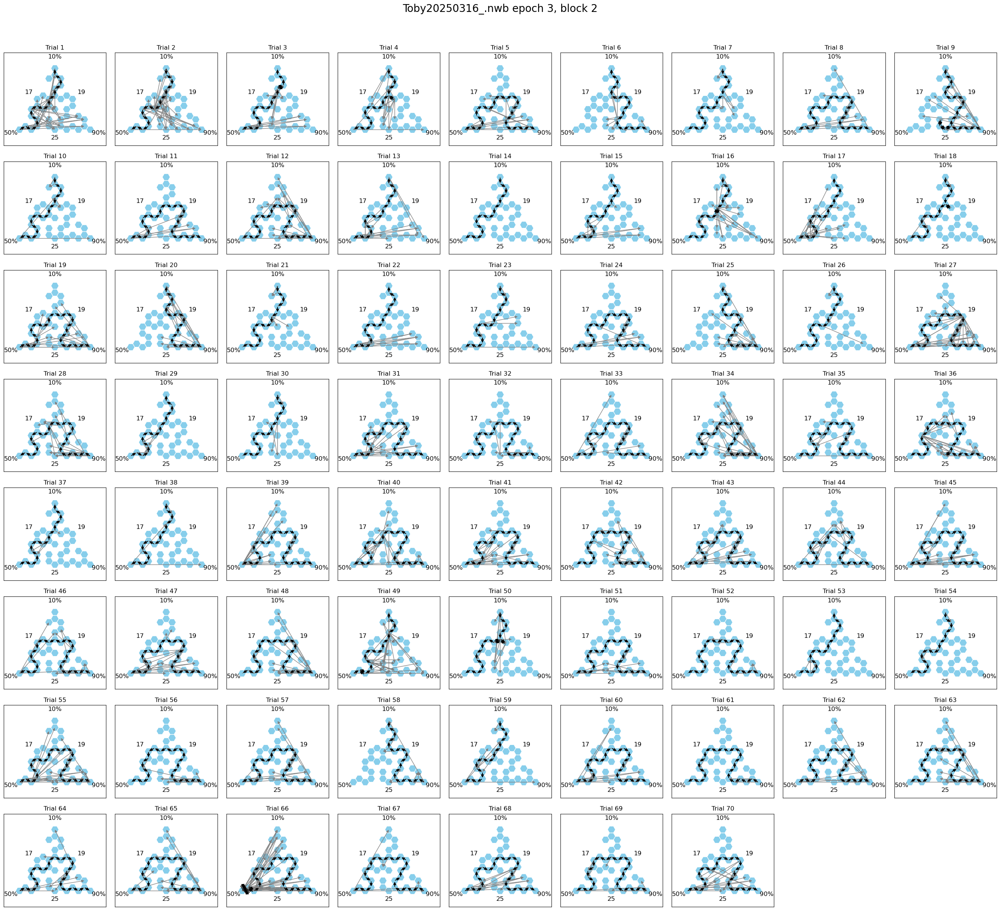

In [87]:
block = 2

# Fetch all trial paths for the block at once
df_block = hex_path_all_trials[hex_path_all_trials["block"] == block]
df_block.reset_index(drop=True)

trials = sorted(df_block["block_trial_num"].unique())
num_trials = len(trials)

# Fetch block info
nwb_file, epoch = epoch_key["nwb_file_name"], epoch_key["epoch"]

# Fetch maze config and reward probabilities for this block
block_entry = HexMazeBlock() & {
    "nwb_file_name": nwb_file,
    "epoch": epoch,
    "block": block,
}
maze_config = block_entry.fetch1("config_id")
reward_probs = [int(block_entry.fetch1(f"p_{x}")) for x in ["a", "b", "c"]]

# Determine square-ish grid
ncols = int(np.ceil(np.sqrt(num_trials)))
nrows = int(np.ceil(num_trials / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))

# Make sure axes is 1D so flatten doesn't break
if isinstance(axes, plt.Axes):
    axes = np.array([axes])
else:
    axes = np.array(axes).flatten()

# Big title
fig.suptitle(f"{nwb_file} epoch {epoch}, block {block}", fontsize=20, y=1.02)

# Loop over trials and plot hex path for each one
for i, tri_num in enumerate(trials):
    df_trial = df_block[df_block["block_trial_num"] == tri_num]
    if df_trial.empty:
        raise ValueError(
            f"No hex path found for block {block}, trial {tri_num}"
        )
    hex_path = df_trial["hex"].tolist()
    
    # Get hexes repped while the rat is in each hex
    hex_to_pred = defaultdict(list)
    for _, row in df_trial.iterrows():
        hex_id = row["hex"]
        hex_to_pred[hex_id].extend(row["repped_hexes"])
    hex_to_pred = {h: list(set(v)) for h, v in hex_to_pred.items()}

    plot_hex_maze(
        barriers=maze_config,
        ax=axes[i],
        hex_path=hex_path,
        arrows=hex_to_pred,
        show_barriers=False,
        show_choice_points=False,
        show_hex_labels=False,
        show_stats=True,
        reward_probabilities=reward_probs,
    )
    axes[i].set_title(f"Trial {tri_num}")

# Hide unused axes
for j in range(num_trials, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


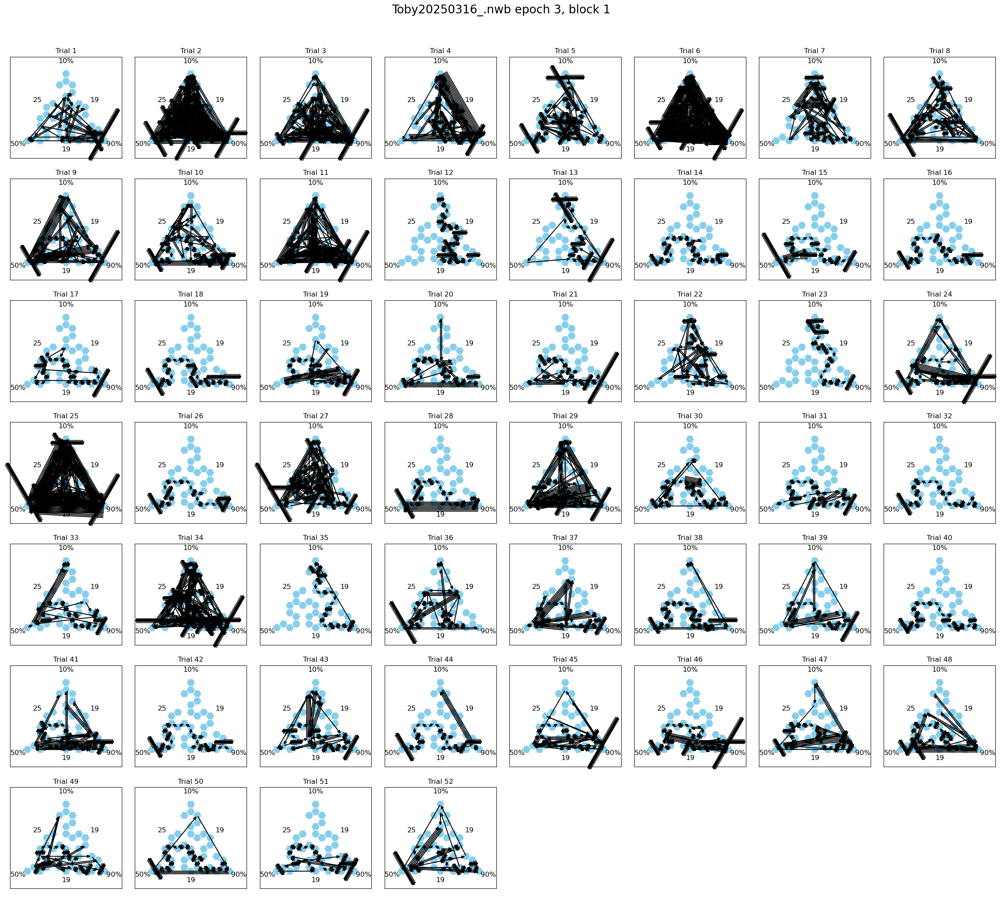

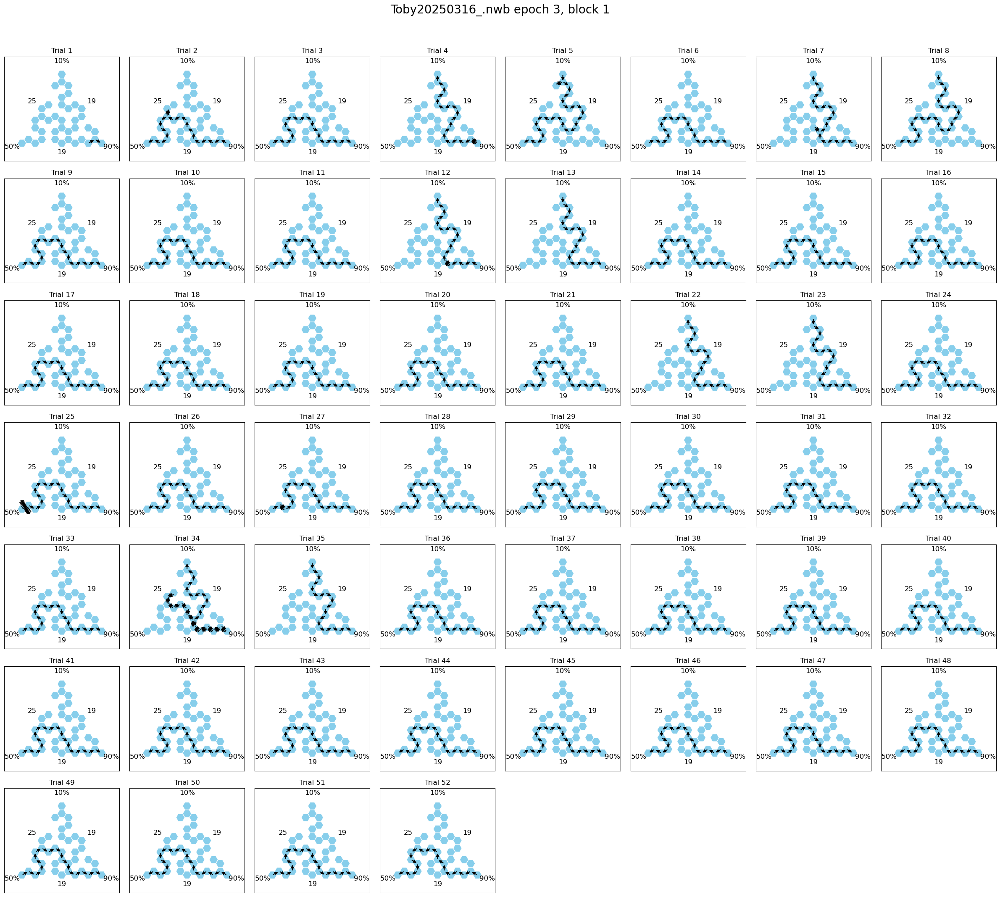

array([<Axes: title={'center': 'Trial 1'}>,
       <Axes: title={'center': 'Trial 2'}>,
       <Axes: title={'center': 'Trial 3'}>,
       <Axes: title={'center': 'Trial 4'}>,
       <Axes: title={'center': 'Trial 5'}>,
       <Axes: title={'center': 'Trial 6'}>,
       <Axes: title={'center': 'Trial 7'}>,
       <Axes: title={'center': 'Trial 8'}>,
       <Axes: title={'center': 'Trial 9'}>,
       <Axes: title={'center': 'Trial 10'}>,
       <Axes: title={'center': 'Trial 11'}>,
       <Axes: title={'center': 'Trial 12'}>,
       <Axes: title={'center': 'Trial 13'}>,
       <Axes: title={'center': 'Trial 14'}>,
       <Axes: title={'center': 'Trial 15'}>,
       <Axes: title={'center': 'Trial 16'}>,
       <Axes: title={'center': 'Trial 17'}>,
       <Axes: title={'center': 'Trial 18'}>,
       <Axes: title={'center': 'Trial 19'}>,
       <Axes: title={'center': 'Trial 20'}>,
       <Axes: title={'center': 'Trial 21'}>,
       <Axes: title={'center': 'Trial 22'}>,
       <Axes: title

In [34]:
(DecodedHexPath() & decode_key).plot_block(block=1)
(HexPath() & hexpath_key).plot_block(block=1)

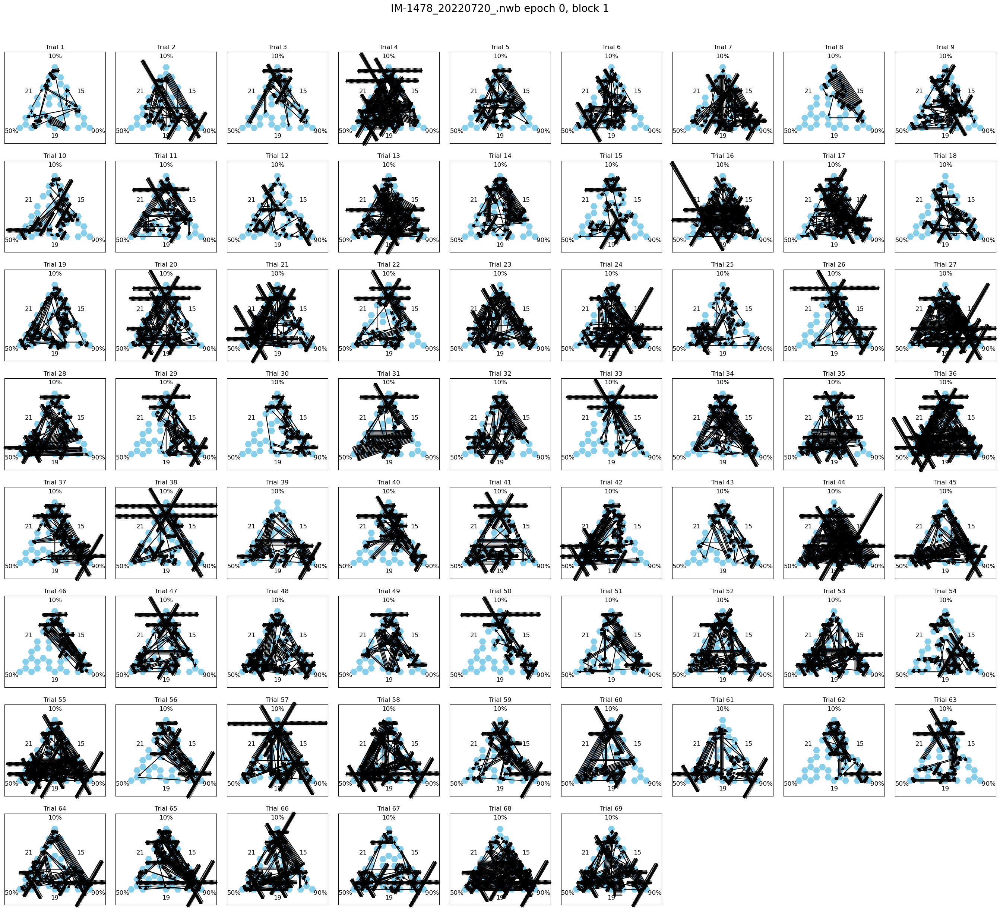

array([<Axes: title={'center': 'Trial 1'}>,
       <Axes: title={'center': 'Trial 2'}>,
       <Axes: title={'center': 'Trial 3'}>,
       <Axes: title={'center': 'Trial 4'}>,
       <Axes: title={'center': 'Trial 5'}>,
       <Axes: title={'center': 'Trial 6'}>,
       <Axes: title={'center': 'Trial 7'}>,
       <Axes: title={'center': 'Trial 8'}>,
       <Axes: title={'center': 'Trial 9'}>,
       <Axes: title={'center': 'Trial 10'}>,
       <Axes: title={'center': 'Trial 11'}>,
       <Axes: title={'center': 'Trial 12'}>,
       <Axes: title={'center': 'Trial 13'}>,
       <Axes: title={'center': 'Trial 14'}>,
       <Axes: title={'center': 'Trial 15'}>,
       <Axes: title={'center': 'Trial 16'}>,
       <Axes: title={'center': 'Trial 17'}>,
       <Axes: title={'center': 'Trial 18'}>,
       <Axes: title={'center': 'Trial 19'}>,
       <Axes: title={'center': 'Trial 20'}>,
       <Axes: title={'center': 'Trial 21'}>,
       <Axes: title={'center': 'Trial 22'}>,
       <Axes: title

In [40]:
(DecodedHexPath() & {"nwb_file_name": "IM-1478_20220720_.nwb"}).plot_block(block=1)

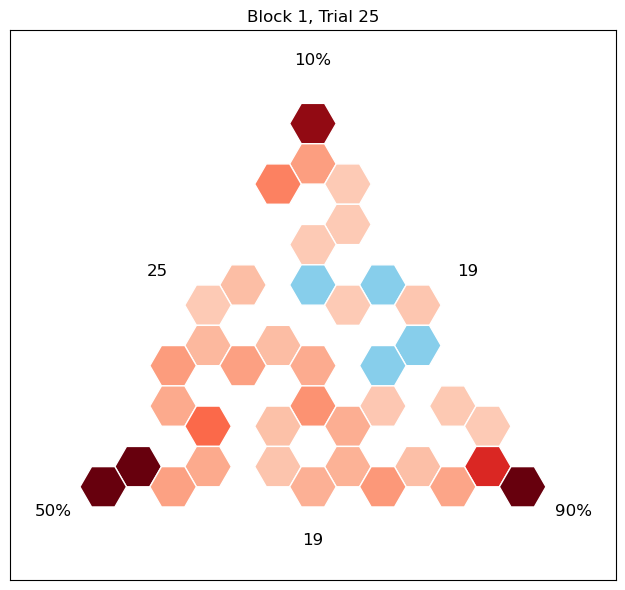

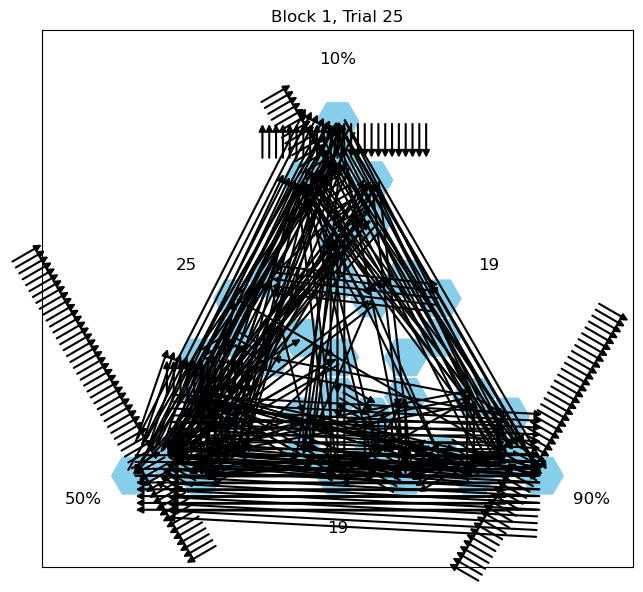

<Axes: title={'center': 'Block 1, Trial 25'}>

In [35]:
import matplotlib.pyplot as plt
from hexmaze import plot_hex_maze

def plot_trial_v2(block, block_trial_num, ax=None, show_stats=True):
        """Plot a single trial's trajectory on the hex maze."""
        
        selfi = (DecodedHexPath() & decode_key)

        # Fetch the hex path df for this trial
        df = selfi.fetch_trial(block, block_trial_num)
        if df.empty:
            raise ValueError(
                f"No hex path found for block {block}, trial {block_trial_num}"
            )

        hex_representation_durations = df.groupby('hex')['duration'].sum().to_dict()

        # Fetch the key for this HexPath entry
        key = selfi.fetch1("KEY")  # contains nwb_file_name + epoch

        # Fetch maze config for the given block in this epoch
        block_entry = HexMazeBlock() & {
            "nwb_file_name": key["nwb_file_name"],
            "epoch": key["epoch"],
            "block": block,
        }
        maze_config = block_entry.fetch1("config_id")

        if show_stats:
            reward_probs = [int(block_entry.fetch1(f"p_{x}")) for x in ["a", "b", "c"]]
        else:
            reward_probs = None

        # Create figure if no axis provided
        created_fig = False
        if ax is None:
            fig, ax = plt.subplots(figsize=(8, 6))
            created_fig = True

        # Plot the maze with the hex path
        # If show_stats, add path lengths and reward probabilities
        plot_hex_maze(
            barriers=maze_config,
            ax=ax,
            #hex_path=hex_path,
            color_by=hex_representation_durations,
            vmin=-.5,
            vmax=2,
            colormap='Reds',
            show_barriers=False,
            show_choice_points=False,
            show_hex_labels=False,
            show_stats=show_stats,
            reward_probabilities=reward_probs,
        )
        ax.set_title(f"Block {block}, Trial {block_trial_num}")

        if created_fig:
            plt.tight_layout()
            plt.show()
        return ax
    
block_trial_num = 25

plot_trial_v2(block=1, block_trial_num=block_trial_num)

(DecodedHexPath() & decode_key).plot_trial(block=1, block_trial_num=block_trial_num)

# What we want:
- filter to moving times
- plot trajectory
- heatmap of what's repped!


In [45]:
import numpy as np

decode_pos_df = (DecodedHexPosition & decode_key).fetch_hex_and_position_dataframe()

display(decode_pos_df)
display(position_df)
display(decode_df)

/home/scrater/miniforge3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:590: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
ndx-franklab-novela - cached version: 0.2.0, loaded version: 0.2.3
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the extension documentation and ignore this warning if these versions are compatible.
  self.warn_for_ignored_namespaces(ignored_namespaces)


,hpd_thresh,spatial_cov,pred_x,pred_y,hex,hex_including_sides,distance_from_centroid
time,,,,,,,
1.742158e+09,0.000217,1127,49.1448,118.800402,43,43,5.921700
1.742158e+09,0.000442,273,51.1336,120.792098,43,43,4.160633
1.742158e+09,0.000217,1164,51.1336,120.792098,43,43,4.160633
1.742158e+09,0.000217,1163,51.1336,120.792098,43,43,4.160633
1.742158e+09,0.000232,957,51.1336,120.792098,43,43,4.160633
...,...,...,...,...,...,...,...
1.742161e+09,0.004889,40,176.4280,142.700759,1,1,5.207562
1.742161e+09,0.004972,41,176.4280,142.700759,1,1,5.207562
1.742161e+09,0.005770,39,176.4280,142.700759,1,1,5.207562


,video_frame_ind,position_x,position_y,orientation,velocity_x,velocity_y,speed,hex,hex_including_sides,distance_from_centroid
time,,,,,,,,,,
1.742158e+09,1574,54.48,119.34,1.976985,1.874179,-3.097967,3.620766,43,43,0.560357
1.742158e+09,1575,54.44,119.20,1.954966,1.368351,-3.045567,3.338841,43,43,0.620967
1.742158e+09,1576,54.42,119.04,1.945788,0.643145,-2.916890,2.986952,43,43,0.697711
1.742158e+09,1577,54.46,118.88,1.945788,-0.196545,-2.520080,2.527733,43,43,0.752861
1.742158e+09,1578,54.52,118.72,1.929567,-1.037131,-1.665916,1.962375,43,43,0.824621
...,...,...,...,...,...,...,...,...,...,...
1.742161e+09,88764,179.42,142.36,1.047518,2.095505,2.179808,3.023691,1,1,8.023092
1.742161e+09,88765,179.66,142.44,0.837981,1.084779,3.282779,3.457366,1,1,8.273452
1.742161e+09,88766,179.86,142.56,0.662730,-0.285596,4.473592,4.482699,1,1,8.492090


,nwb_file_name,epoch,block,block_trial_num,epoch_trial_num,hex,entry_time,exit_time,duration,hex_in_trial,hex_entry_num,hexes_from_start,hexes_from_end,hex_type,maze_portion
id,,,,,,,,,,,,,,,
0,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,0.010,1,1,-1,2,optimal,chosen
1,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,0.052,2,1,-1,1,optimal,chosen
2,Toby20250316_.nwb,3,1,1,1,43,1.742158e+09,1.742158e+09,0.000,3,2,-1,2,optimal,chosen
3,Toby20250316_.nwb,3,1,1,1,48,1.742158e+09,1.742158e+09,0.050,4,2,-1,1,optimal,chosen
4,Toby20250316_.nwb,3,1,1,1,41,1.742158e+09,1.742158e+09,0.054,5,1,-1,7,non_optimal,unchosen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36425,Toby20250316_.nwb,3,5,10,216,1,1.742161e+09,1.742161e+09,0.000,794,16,16,0,optimal,chosen
36426,Toby20250316_.nwb,3,5,10,216,4,1.742161e+09,1.742161e+09,0.122,795,22,15,1,optimal,chosen
36427,Toby20250316_.nwb,3,5,10,216,1,1.742161e+09,1.742161e+09,0.058,796,17,16,0,optimal,chosen


In [ ]:
# from spyglass_hexmaze.hex_maze_decoding import DecodedHexPath, DecodedHexPosition

# # Populate DecodedHexPath for all entries in DecodedHexPosition
# hex_pos_keys = DecodedHexPosition().fetch("KEY")
# for hex_pos_key in hex_pos_keys:
#     DecodedHexPath.populate(hex_pos_key)

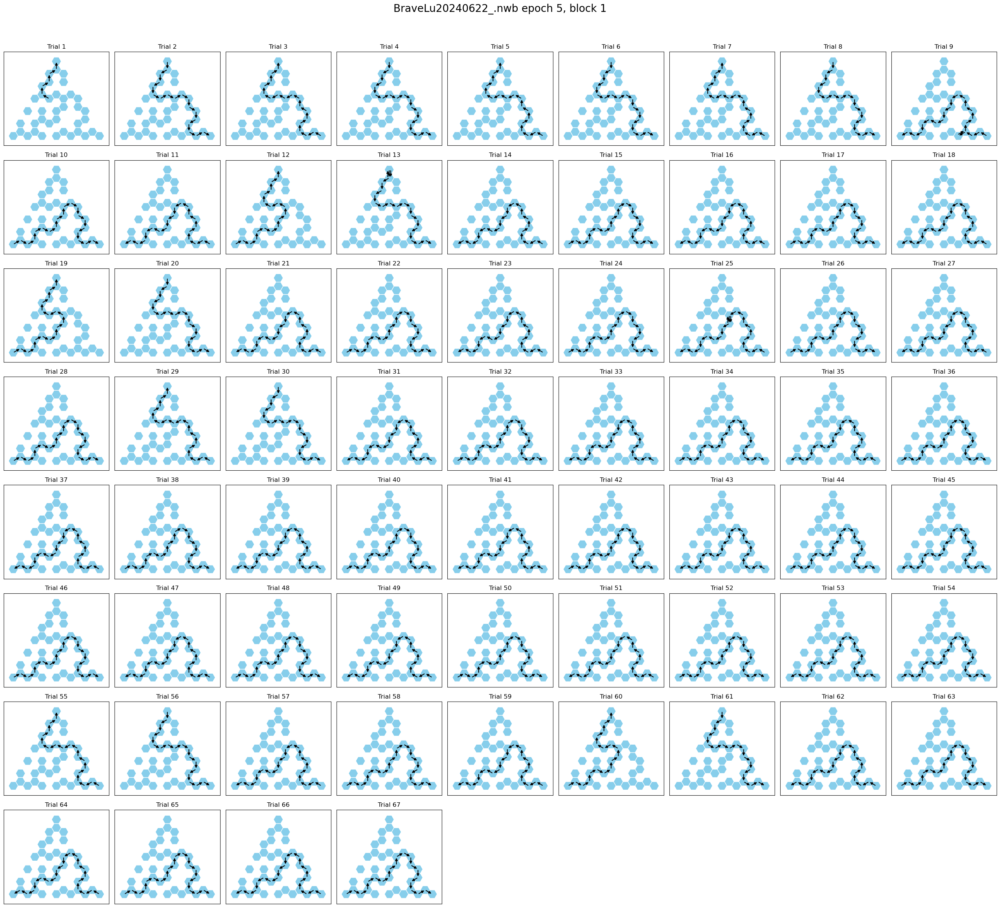

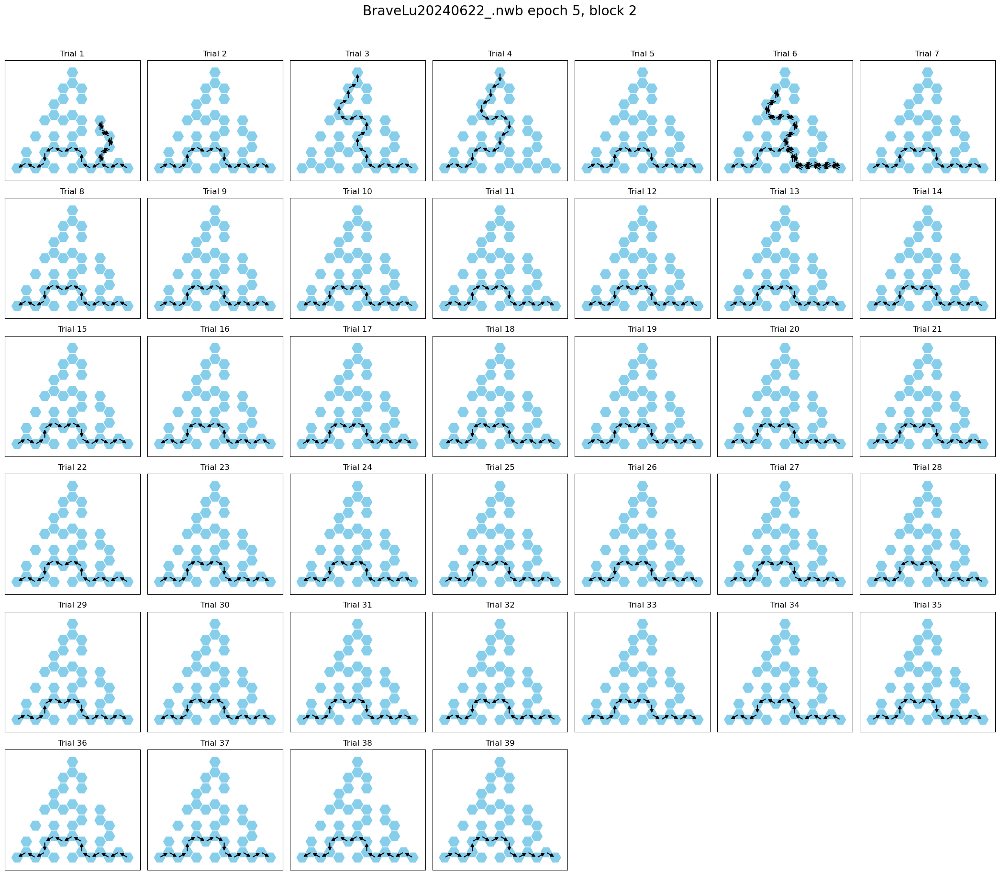

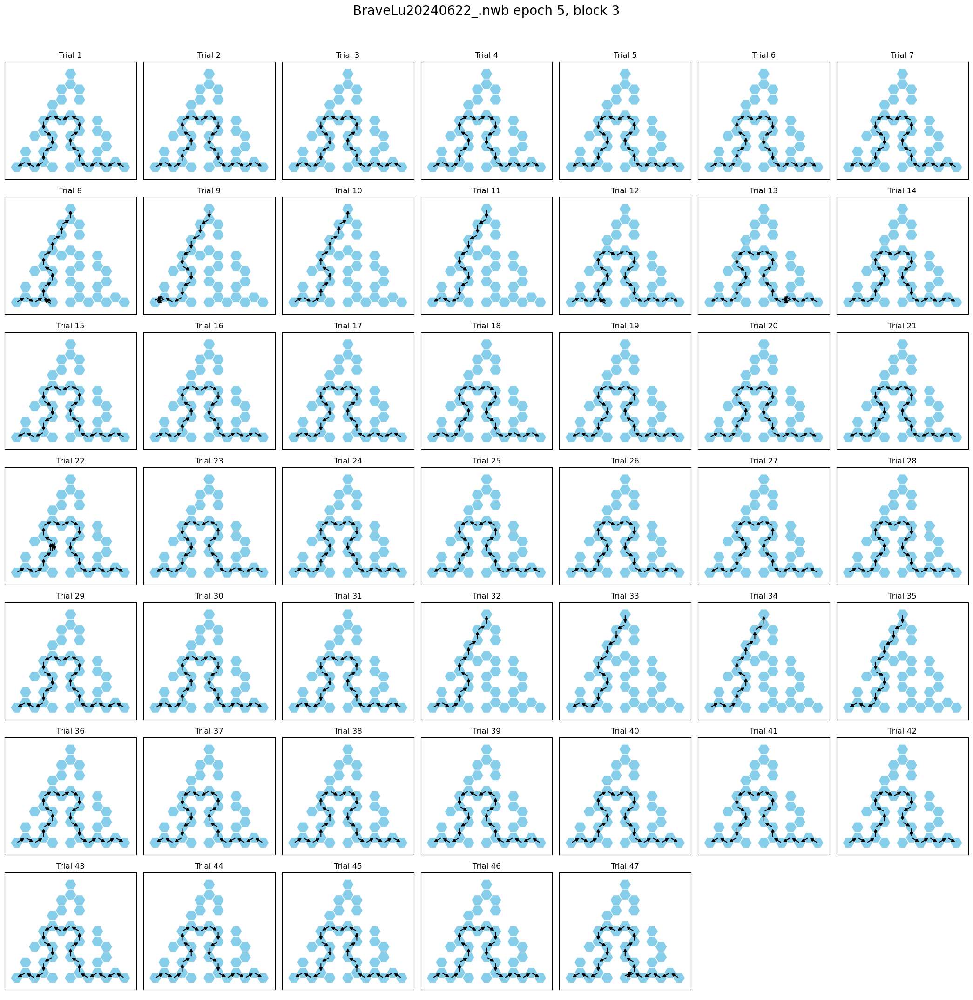

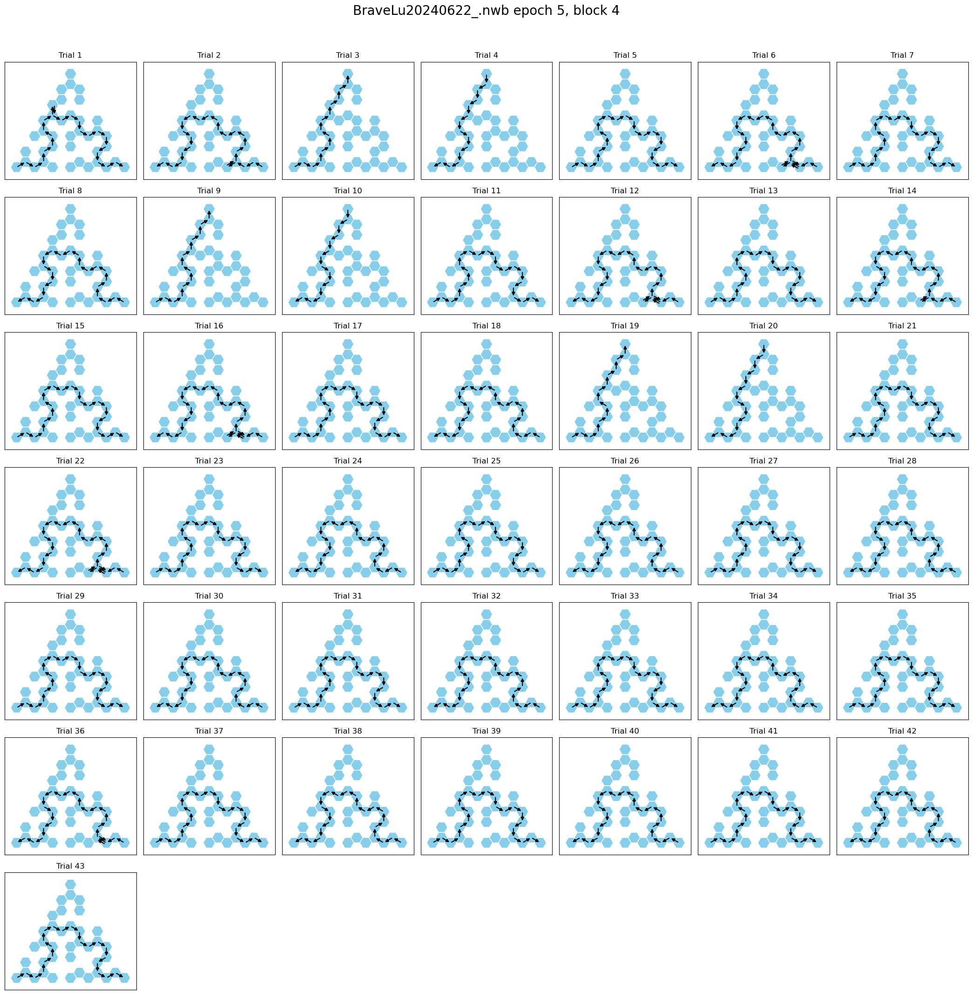

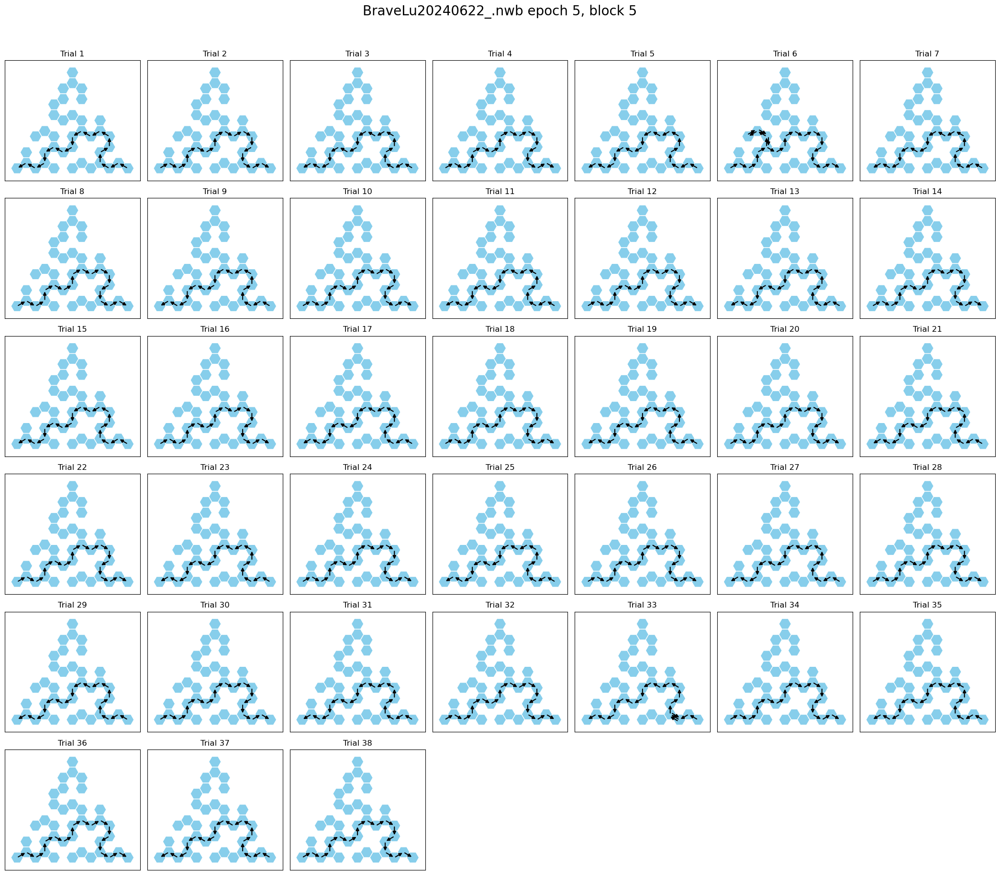

In [ ]:
nwb_file_name = 'BraveLu20240622_.nwb'
epoch = 5
nwb_key = {"nwb_file_name" : nwb_file_name}
nwb_epoch_key = {"nwb_file_name" : nwb_file_name, "epoch": epoch}

ax = (HexPath() & nwb_epoch_key).plot_block(block=1, show_stats=False)
ax = (HexPath() & nwb_epoch_key).plot_block(block=2, show_stats=False)
ax = (HexPath() & nwb_epoch_key).plot_block(block=3, show_stats=False)
ax = (HexPath() & nwb_epoch_key).plot_block(block=4, show_stats=False)
ax = (HexPath() & nwb_epoch_key).plot_block(block=5, show_stats=False)